In [264]:
import glob
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import squidpy as sq
from scipy import sparse
import matplotlib.pyplot as plt
import seaborn as sns

sc.settings.n_jobs = 8
sc.settings.set_figure_params(dpi=100, facecolor='white', figsize=(5,5), frameon=False)

In [265]:
dir_list = glob.glob('../data/Zhuang/*/')
dir_list.sort()
dir_list = dir_list[:-1]

In [266]:
meta_cluster = pd.read_csv('../data/Zhuang/co1/cell_metadata_with_cluster_annotation.csv', index_col=0)

In [267]:
def read_zhuang(path):
    prefix = path.split('/')[-2]
    adata = sc.read_h5ad(f'{path}{prefix}_log2.h5ad')
    adata.var['gene_identifier'] = adata.var.index
    
    # meta_cell = pd.read_csv(f'{path}cell_metadata.csv', index_col=0)
    cff = pd.read_csv(f'{path}ccf_coordinates.csv', index_col=0)
    cff.columns = ['ccf_x','ccf_y','ccf_z','parcellation_index']
    meta_cluster = pd.read_csv(f'{path}cell_metadata_with_cluster_annotation.csv', index_col=0)
    meta_cell = pd.concat([cff, meta_cluster], axis=1, join="inner")
    adata = adata[meta_cell.index].copy()
    adata.obs = meta_cell
    adata.obs = adata.obs.loc[:,~adata.obs.columns.duplicated()].copy()
    
    meta_gene = pd.read_csv(f'{path}gene.csv', index_col=0)
    adata.var = pd.concat([adata.var, meta_gene], axis=1, join="inner")
    adata.var = adata.var.loc[:,~adata.var.columns.duplicated()].copy()
    adata.var.set_index('gene_symbol', inplace=True)
    
    return adata

In [268]:
adatas = list(map(read_zhuang, dir_list))

In [269]:
adatas[0].obs['class'][adatas[0].obs['class'].str.contains('LSX')] = adatas[0].obs.subclass[adatas[0].obs['class'].str.contains('LSX')]

/var/folders/pg/_gfvzhnj3zxc0lm8r3cm3jc00000gn/T/ipykernel_87738/4290982491.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adatas[0].obs['class'][adatas[0].obs['class'].str.contains('LSX')] = adatas[0].obs.subclass[adatas[0].obs['class'].str.contains('LSX')]


In [270]:
adatas[0].obs['class_new'] = adatas[0].obs['class'].str.split(' ').str[1:].str.join(' ')

In [271]:
import SimpleITK as sitk

annotation_boundary_image = sitk.ReadImage('../data/resampled_annotation_boundary.nii.gz')
annotation_boundary_array = sitk.GetArrayViewFromImage(annotation_boundary_image)

In [331]:
lsx = adatas[0].obs[adatas[0].obs['class_new'].str.contains('LSX')]['class_new'].unique()

In [401]:
adatas[0].obsm['CCF_3D'] = adatas[0].obs[['ccf_z','ccf_y','ccf_x']].values
adatas[0].obsm['CCF'] = adatas[0].obs[['ccf_z','ccf_y']].values
# adatas[0].obsm['CCF'][:,1] = adatas[0].obsm['CCF'][:,1] * -1

In [382]:
lsx_reg_cnt = adatas[0].obs[adatas[0].obs['class'].str.contains('LSX')].brain_section_label.value_counts().to_frame()

In [387]:
lsx_reg = lsx_reg_cnt[lsx_reg_cnt['count'] > 150].index

In [388]:
lsx_reg = lsx_reg.remove_unused_categories()

In [361]:
adatas[0].obs.brain_section_label = adatas[0].obs.brain_section_label.astype('category')

/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:324: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = ax.scatter(


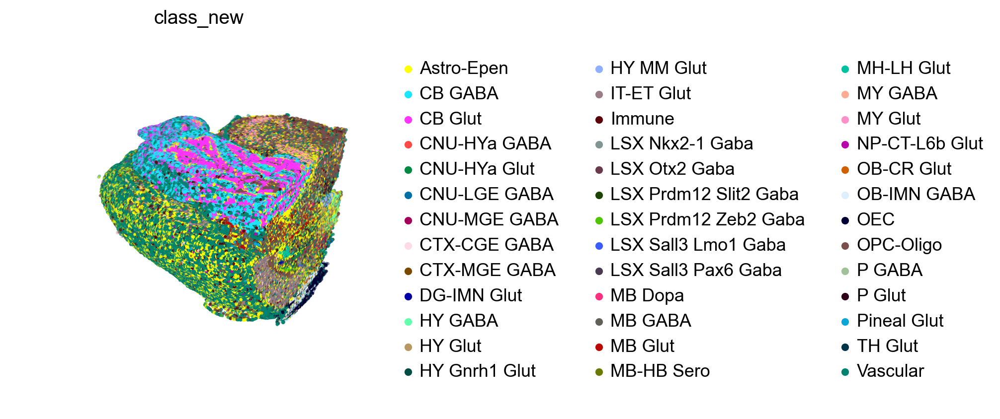

In [280]:
sc.pl.embedding(adatas[0], basis='CCF_3D', color=['class_new'], projection="3d", s=15)

/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


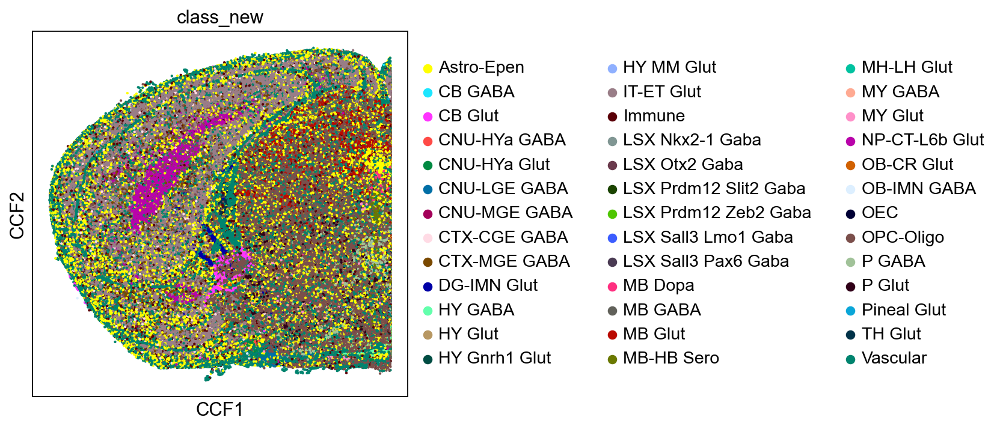

In [328]:
sc.pl.embedding(adatas[0], basis='CCF', color=['class_new'], s=15)

Zhuang-ABCA-1.049


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

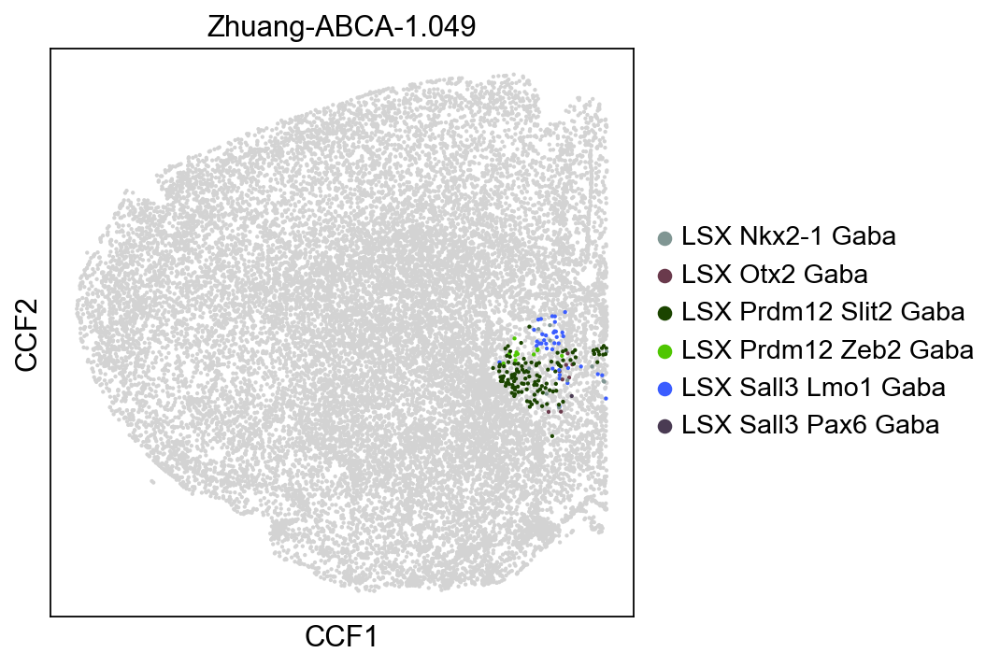

Zhuang-ABCA-1.050


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

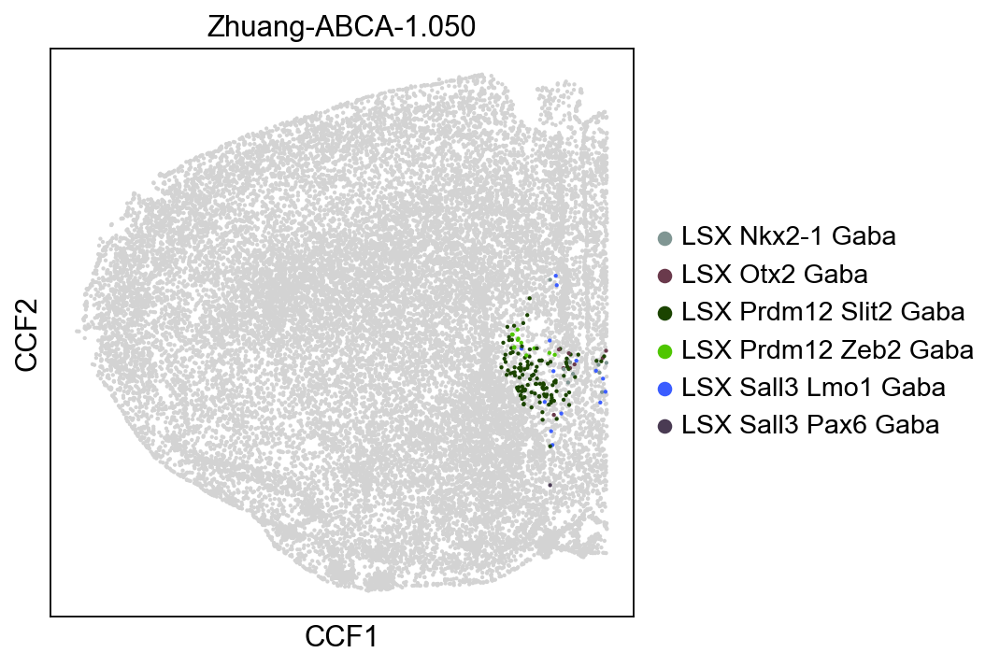

Zhuang-ABCA-1.051


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

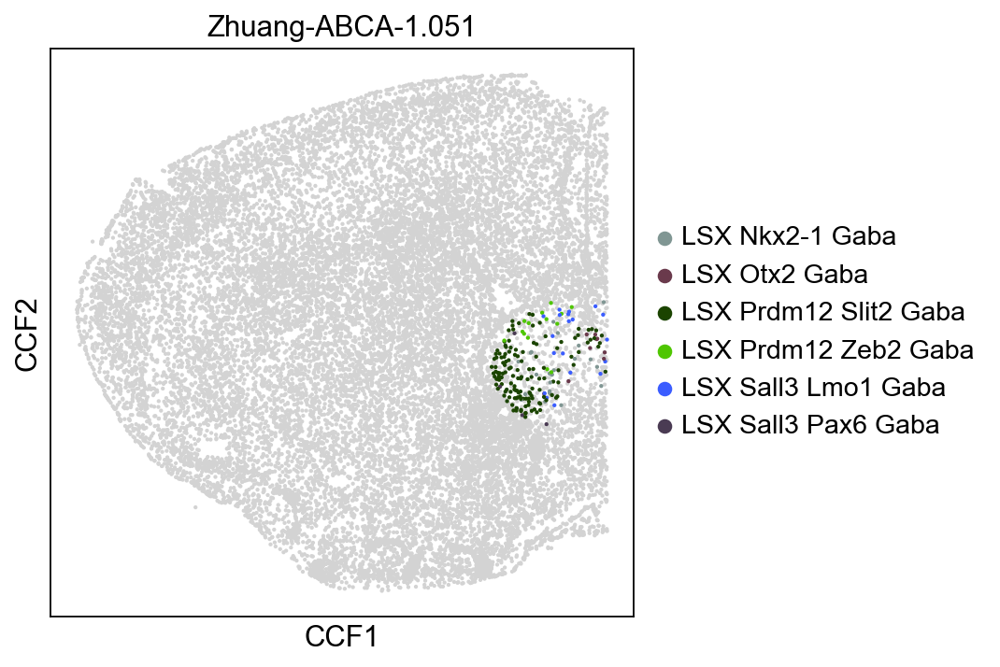

Zhuang-ABCA-1.052


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

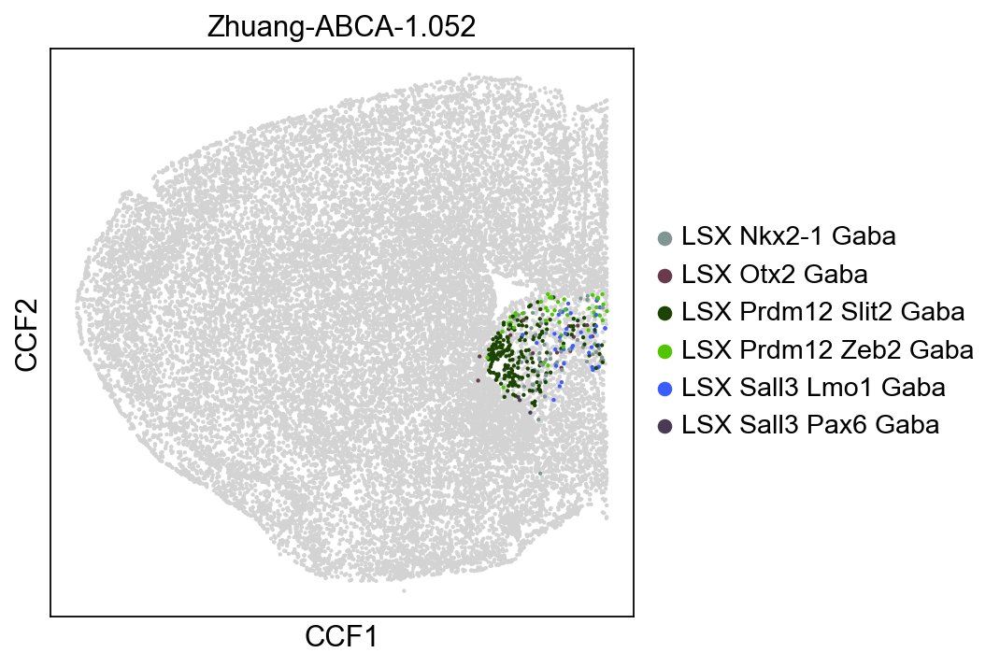

Zhuang-ABCA-1.053


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

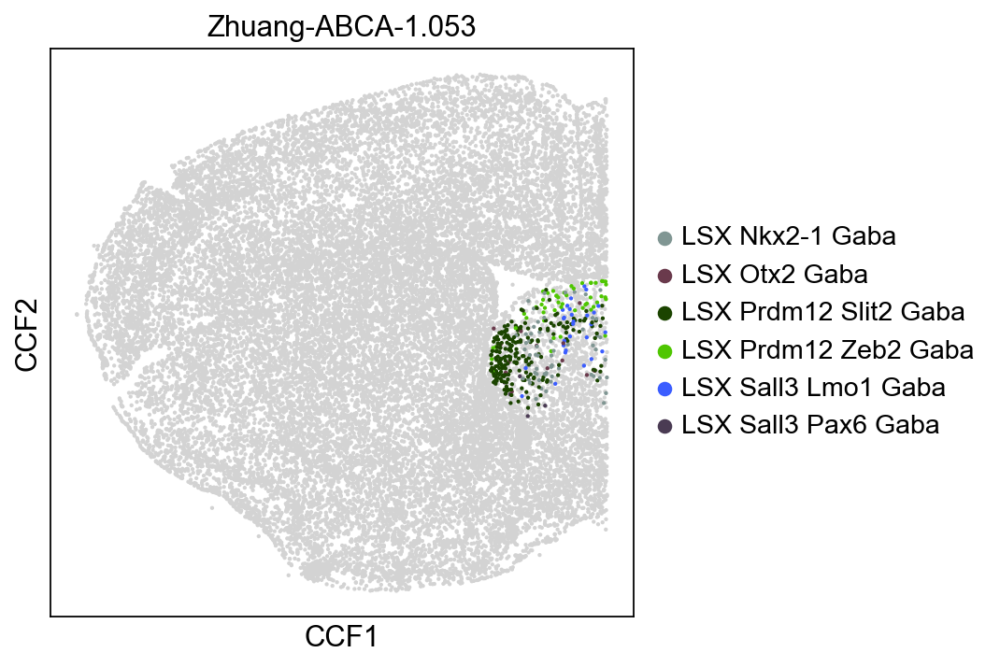

Zhuang-ABCA-1.054


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

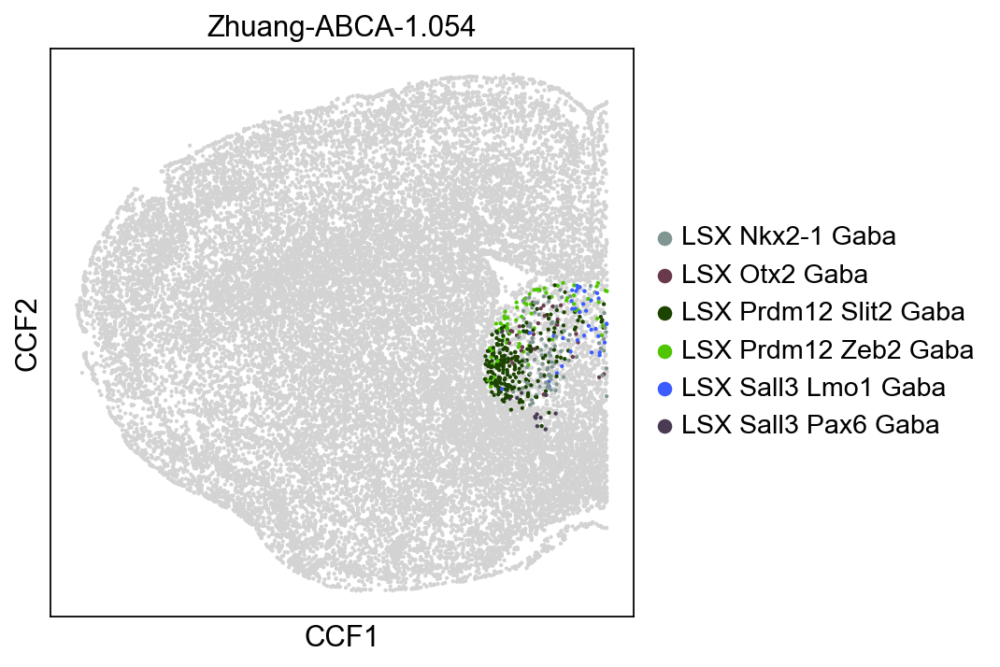

Zhuang-ABCA-1.056


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

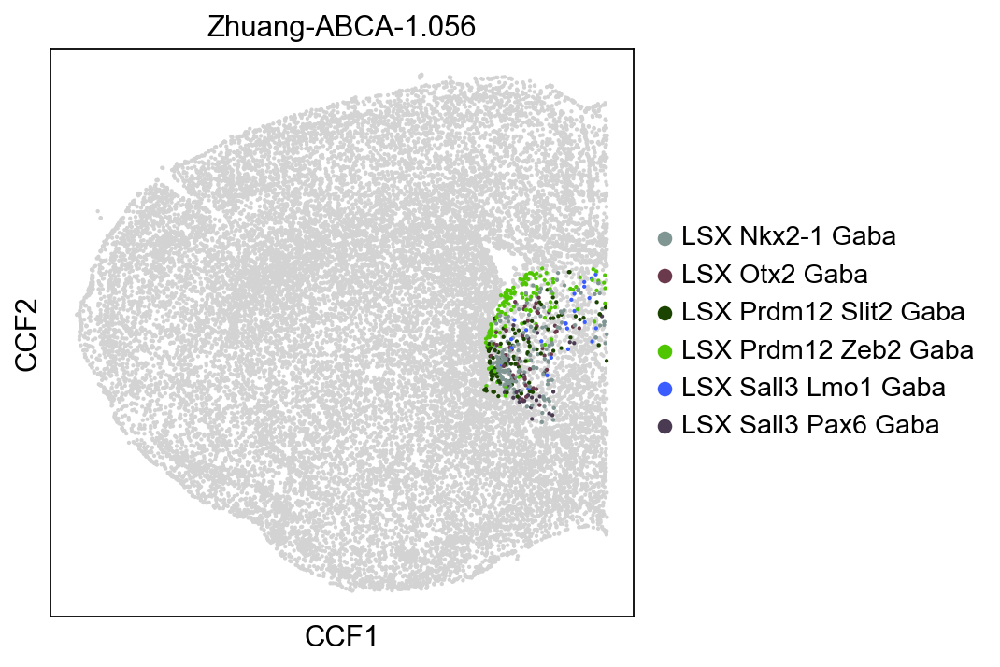

Zhuang-ABCA-1.057


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

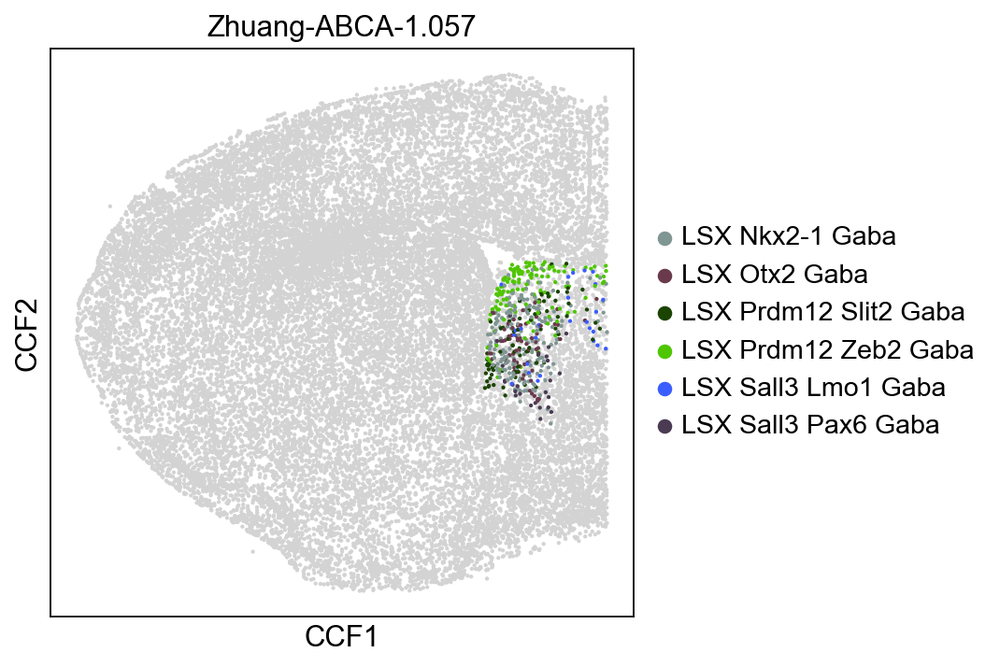

Zhuang-ABCA-1.058


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

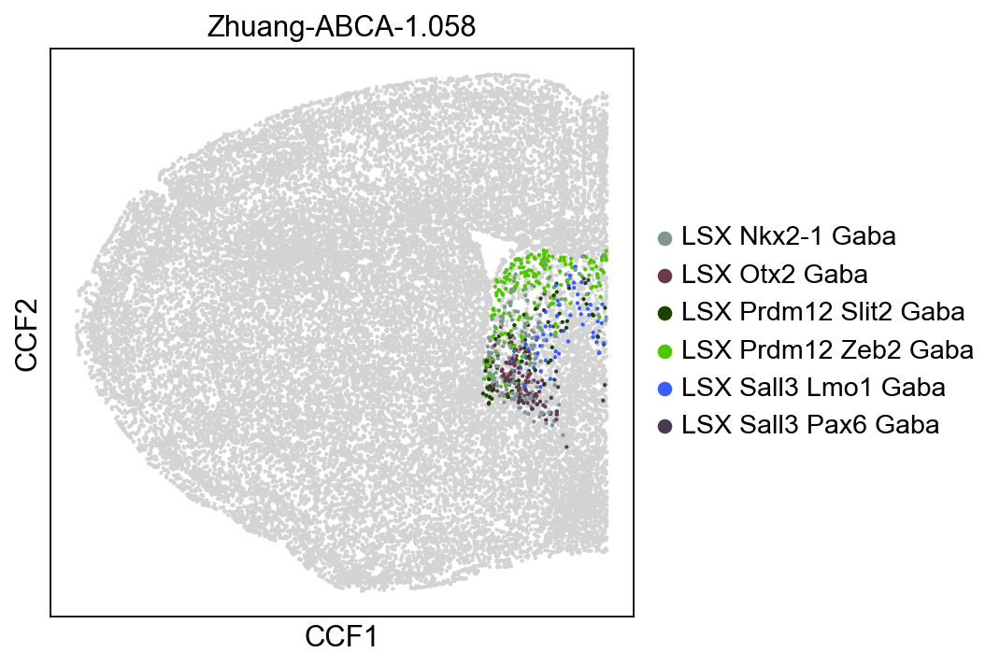

Zhuang-ABCA-1.059


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

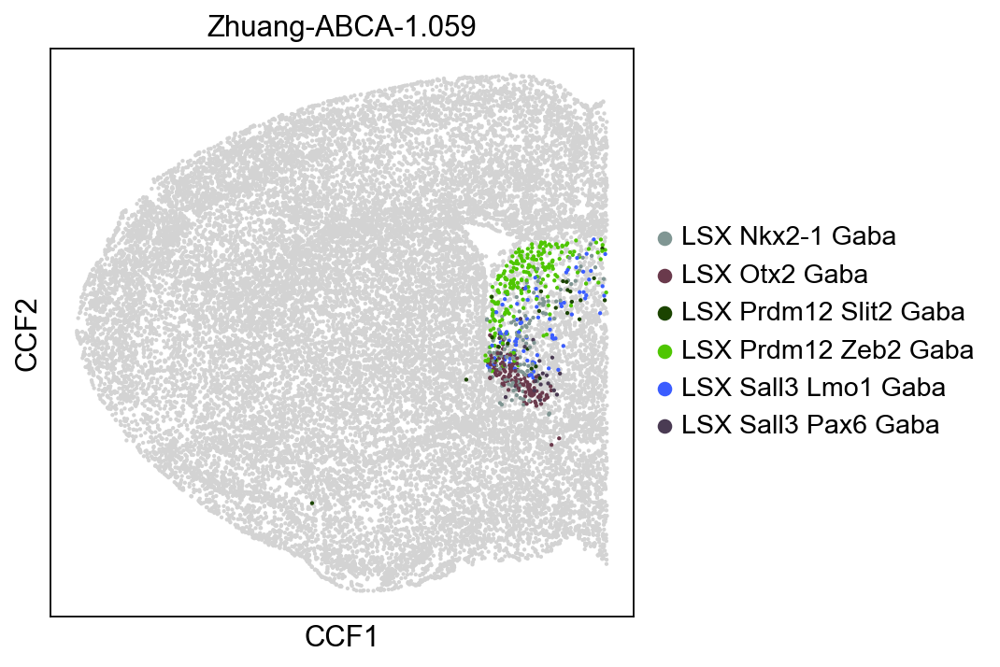

Zhuang-ABCA-1.060


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

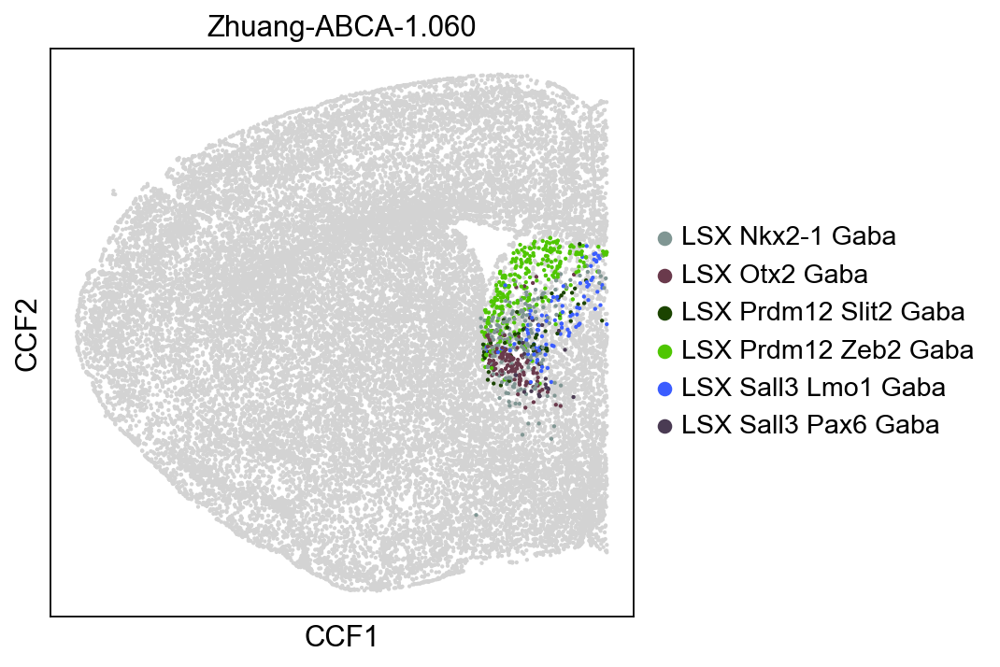

Zhuang-ABCA-1.061


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

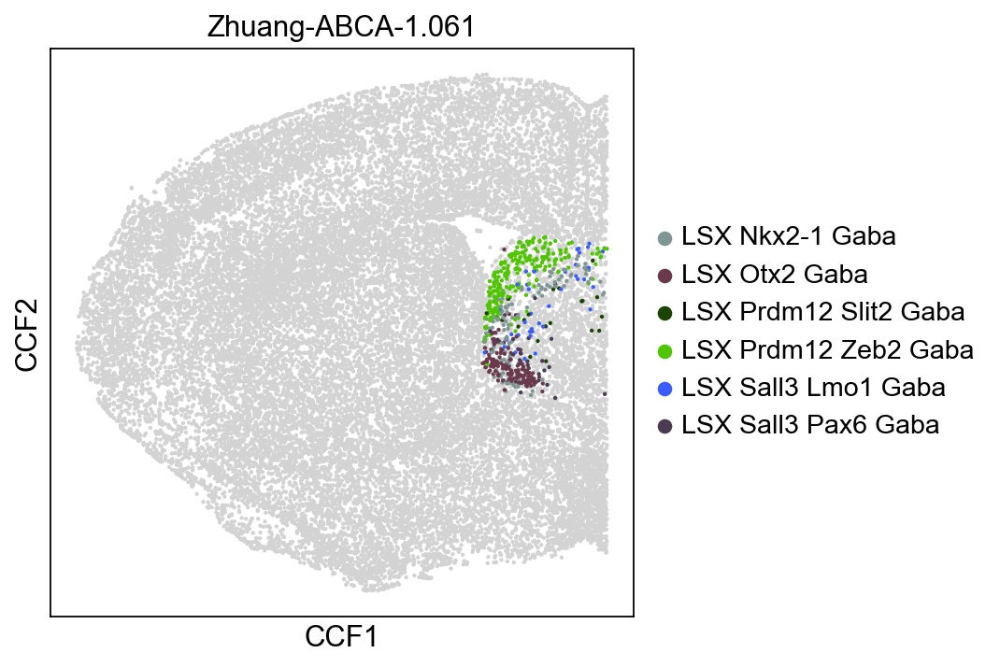

Zhuang-ABCA-1.062


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

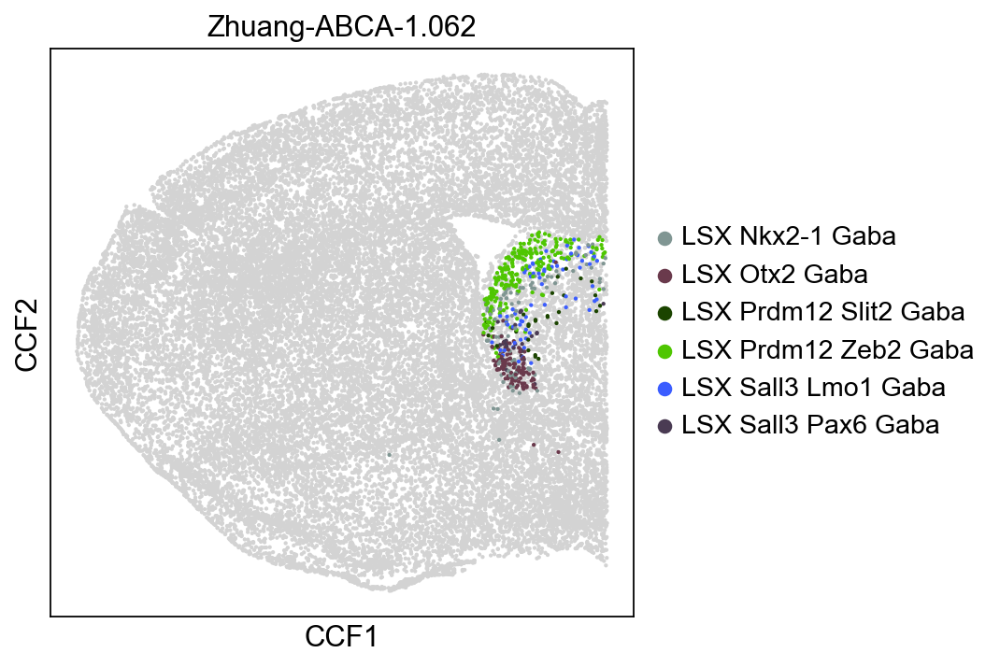

/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


Zhuang-ABCA-1.063


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


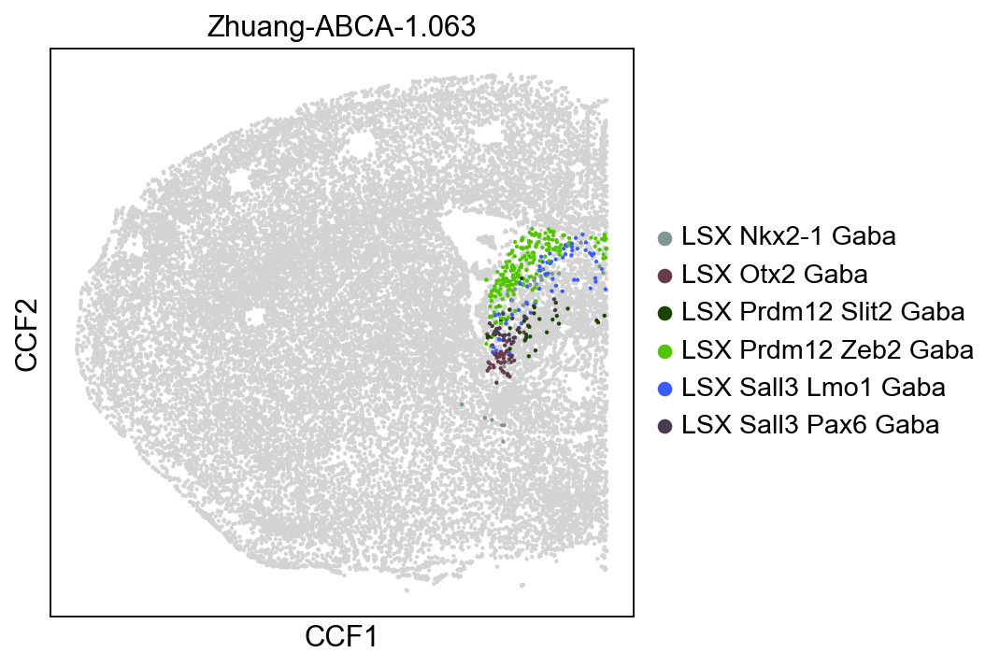

Zhuang-ABCA-1.064


/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1169: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if groups and is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/pax/miniconda3/envs/LS_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/pax/miniconda3

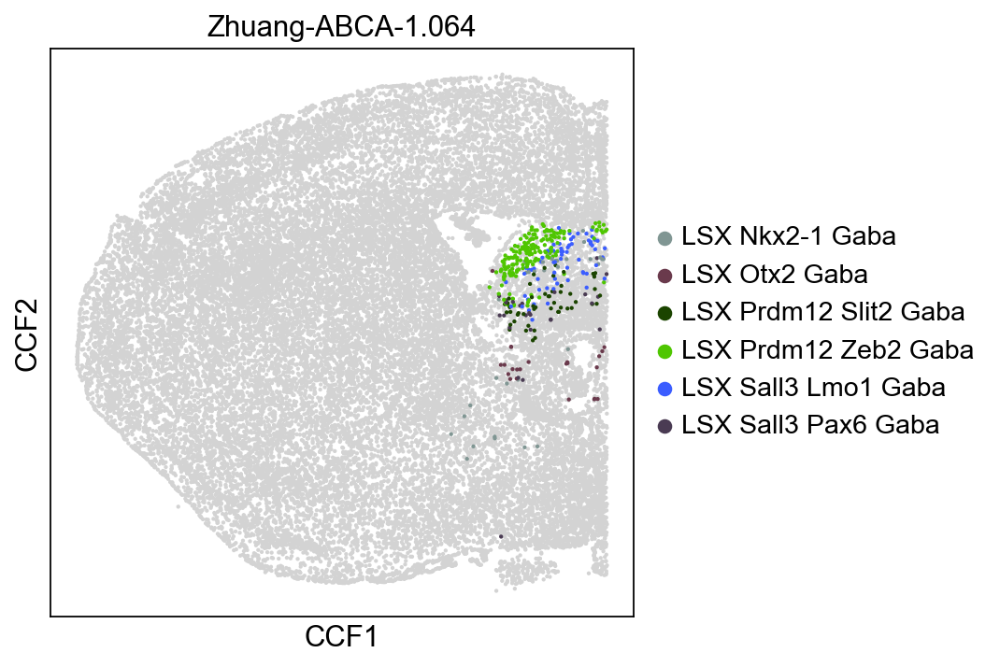

In [371]:
sc.set_figure_params(figsize=(5,5), dpi_save=300)
for id in lsx_reg.categories:
    print(id)
    sc.pl.embedding(adatas[0][adatas[0].obs.brain_section_label == id], basis='CCF', color=['class_new'], s=15, groups=lsx, na_in_legend=False, title=id)

In [394]:
lsx_reg_list = ['Zhuang-ABCA-1.049',
 'Zhuang-ABCA-1.051',
 'Zhuang-ABCA-1.052',
 'Zhuang-ABCA-1.053',
 'Zhuang-ABCA-1.054',
 'Zhuang-ABCA-1.056',
 'Zhuang-ABCA-1.057',
 'Zhuang-ABCA-1.058',
 'Zhuang-ABCA-1.059',
 'Zhuang-ABCA-1.060',
 'Zhuang-ABCA-1.061',
 'Zhuang-ABCA-1.062',
 'Zhuang-ABCA-1.063',
 'Zhuang-ABCA-1.064']

In [395]:
reg_map = dict(zip(lsx_reg_list, [50,49,47,47,46,46,45,45,45,44,44,44,43,42]))

In [545]:
adatas[0].uns['spatial'] = {}
for id in reg_map.keys():
    print(id)
    sec_ = reg_map[id]
    boundary_slice = annotation_boundary_array[sec_,:,:]
    img = sq.im.ImageContainer(boundary_slice, library_ids=id)
    adatas[0].uns['spatial'][id] = {}
    adatas[0].uns['spatial'][id]["images"] = {"hires": boundary_slice.reshape(boundary_slice.shape[0], boundary_slice.shape[1], 1)}
    adatas[0].uns['spatial'][id]["scalefactors"] = {
    "tissue_hires_scalef": 1,
    "spot_diameter_fullres": 0.5,
}

Zhuang-ABCA-1.049
Zhuang-ABCA-1.051
Zhuang-ABCA-1.052
Zhuang-ABCA-1.053
Zhuang-ABCA-1.054
Zhuang-ABCA-1.056
Zhuang-ABCA-1.057
Zhuang-ABCA-1.058
Zhuang-ABCA-1.059
Zhuang-ABCA-1.060
Zhuang-ABCA-1.061
Zhuang-ABCA-1.062
Zhuang-ABCA-1.063
Zhuang-ABCA-1.064


In [539]:
adatas[0].obsm['spatial'] = adatas[0].obsm['CCF']

In [763]:
adatas[0].obs['LSX'] = adatas[0].obs['class_new'].map(lambda x: x if x in lsx else 'N.A.')

In [619]:
color_map = dict(zip(adatas[0].obs.class_new.cat.categories,adatas[0].uns['class_new_colors']))
color_map['N.A.'] = '#ffffff'

In [757]:
lsx_map = {'Astro-Epen': '#ffff00',
 'CB GABA': '#1ce6ff',
 'CB Glut': '#ff34ff',
 'CNU-HYa GABA': '#ff4a46',
 'CNU-HYa Glut': '#008941',
 'CNU-LGE GABA': '#006fa6',
 'CNU-MGE GABA': '#a30059',
 'CTX-CGE GABA': '#ffdbe5',
 'CTX-MGE GABA': '#7a4900',
 'DG-IMN Glut': '#0000a6',
 'HY GABA': '#63ffac',
 'HY Glut': '#b79762',
 'HY Gnrh1 Glut': '#004d43',
 'HY MM Glut': '#8fb0ff',
 'IT-ET Glut': '#997d87',
 'Immune': '#5a0007',
 'LSX Nkx2-1 Gaba': '#809693',
 'LSX Otx2 Gaba': '#6a3a4c',
 'LSX Slit2 Gaba': '#1b4400',
 'LSX Zeb2 Gaba': '#4fc601',
 'LSX Sall3 Lmo1 Gaba': '#3b5dff',
 'LSX Sall3 Pax6 Gaba': '#4a3b53',
 'MB Dopa': '#ff2f80',
 'MB GABA': '#61615a',
 'MB Glut': '#ba0900',
 'MB-HB Sero': '#6b7900',
 'MH-LH Glut': '#00c2a0',
 'MY GABA': '#ffaa92',
 'MY Glut': '#ff90c9',
 'NP-CT-L6b Glut': '#b903aa',
 'OB-CR Glut': '#d16100',
 'OB-IMN GABA': '#ddefff',
 'OEC': '#000035',
 'OPC-Oligo': '#7b4f4b',
 'P GABA': '#a1c299',
 'P Glut': '#300018',
 'Pineal Glut': '#0aa6d8',
 'TH Glut': '#013349',
 'Vascular': '#00846f',
 'N.A.': '#ffffff'}

In [764]:
adatas[0].obs["LSX"] = adatas[0].obs["LSX"].str.replace('Prdm12 ', '')

In [765]:
# defind a helper plotting function to plot LSX celltypes on to CCF coordinates
def plot_ccf_lsx(library_id):
    spatial = adatas[0][(adatas[0].obs["brain_section_label"] == library_id) & (adatas[0].obs["LSX"] != 'N.A.')].obsm['spatial']
    img = adatas[0][(adatas[0].obs["brain_section_label"] == library_id) & (adatas[0].obs["LSX"] != 'N.A.')].uns['spatial'][library_id]["images"]['hires']
    hue = adatas[0][(adatas[0].obs["brain_section_label"] == library_id) & (adatas[0].obs["LSX"] != 'N.A.')].obs['LSX']

    fig, ax = plt.subplots()
    fig.set_size_inches(9,9)
    sns.scatterplot(x=spatial[:,0],y=spatial[:,1],s=8,zorder=1, hue=hue, palette=lsx_map, ax=ax, alpha=1)
    ax.imshow(img, cmap=plt.cm.Greys, alpha=1.0*(img.squeeze()>0), zorder=2, extent=(0.1,11.3,10,-1.75))
    ax.grid(False)
    ax.legend(loc='upper right', bbox_to_anchor=(1.35, 1.0), ncol=1, markerscale=3)
    ax.set_ylim(11,0)
    ax.set_xlim(0,11)
    ax.axis('equal')
    ax.set_xticks([])
    ax.set_yticks([])
    return fig, ax

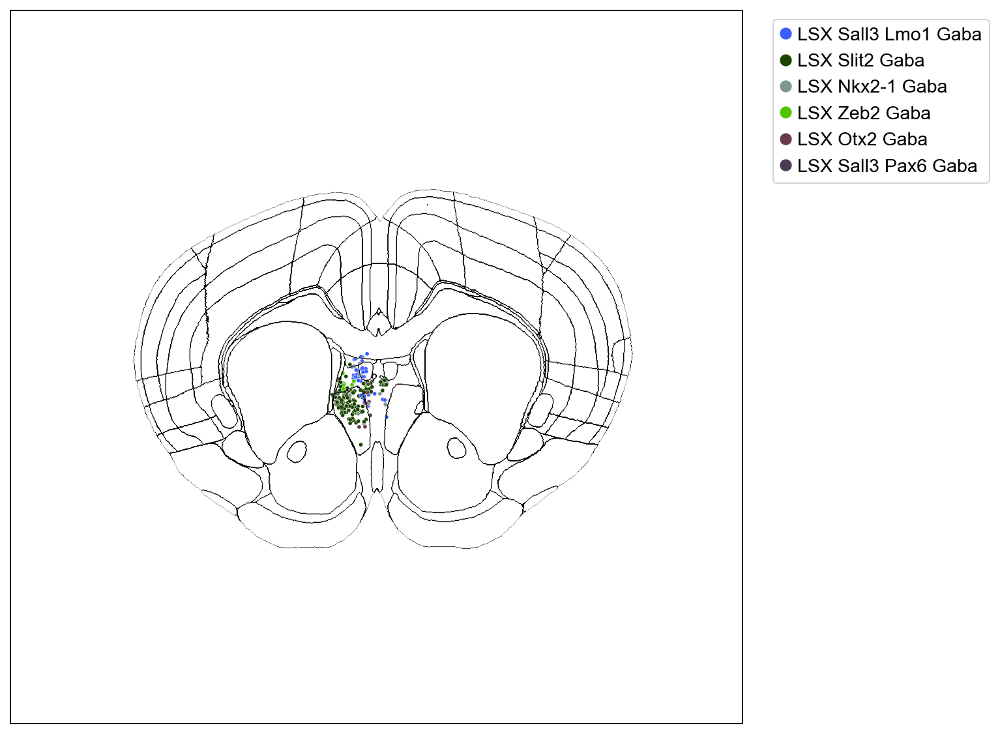

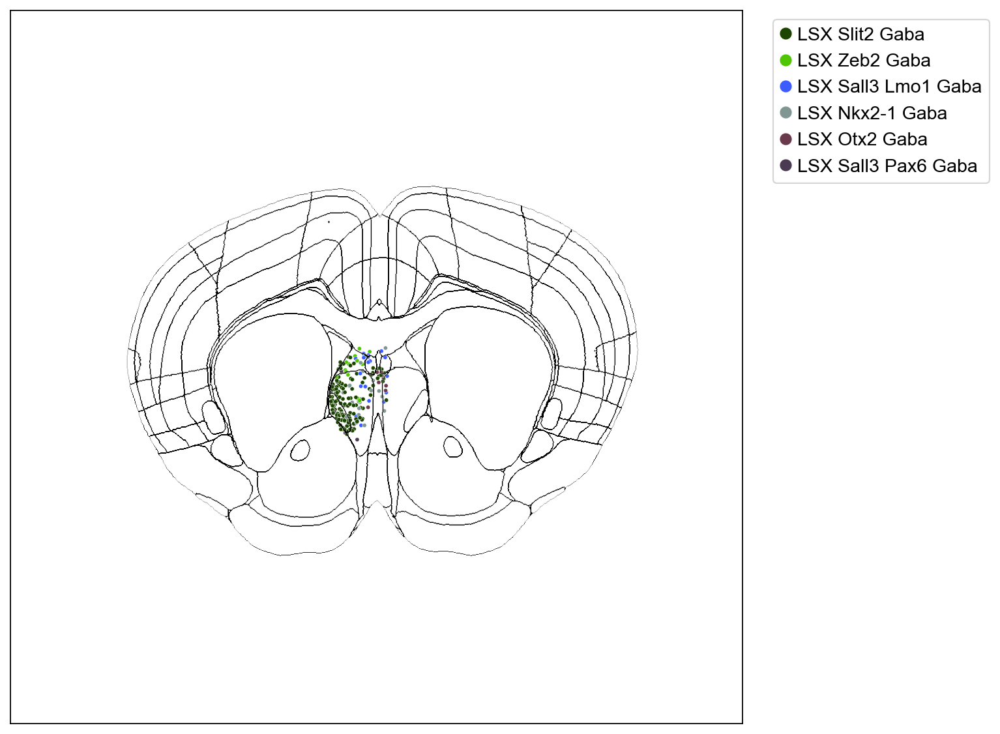

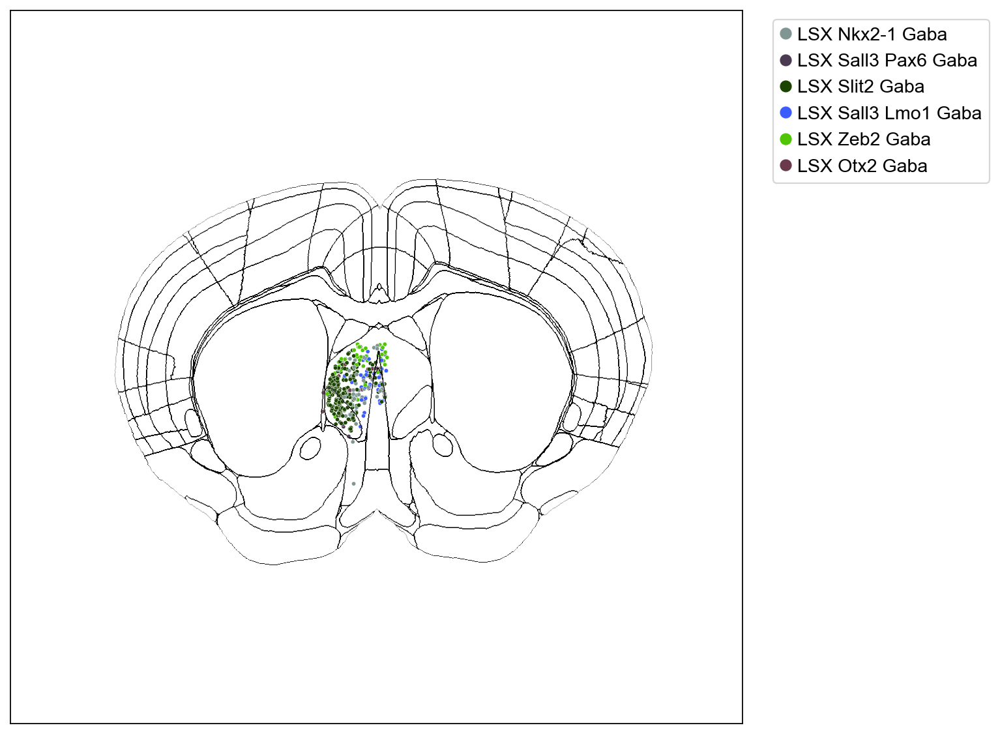

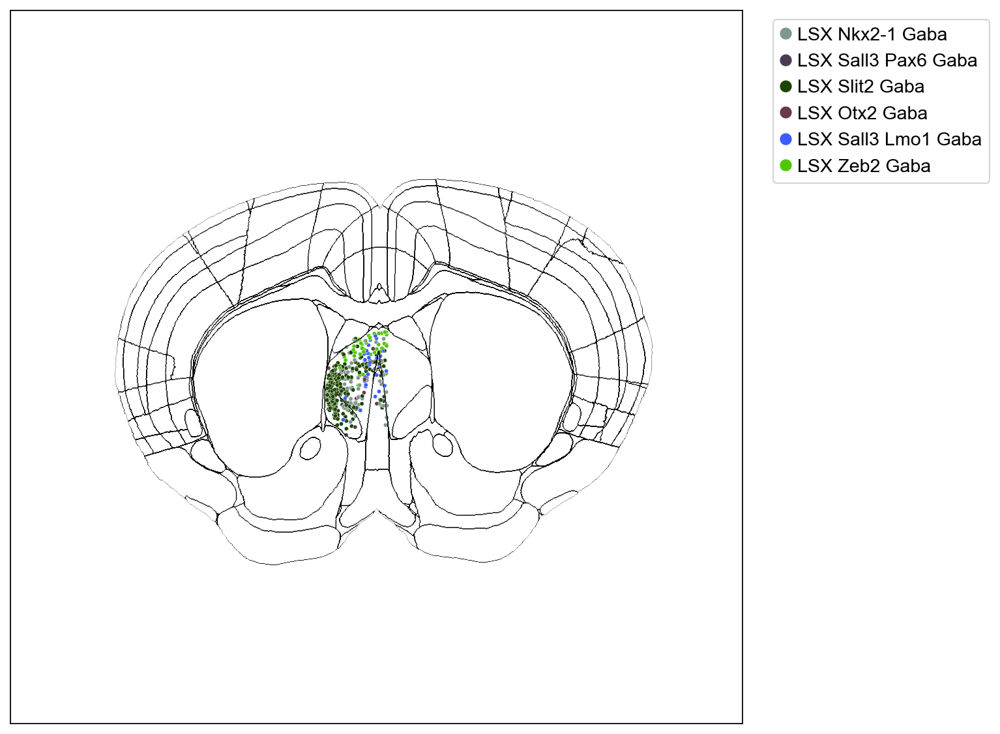

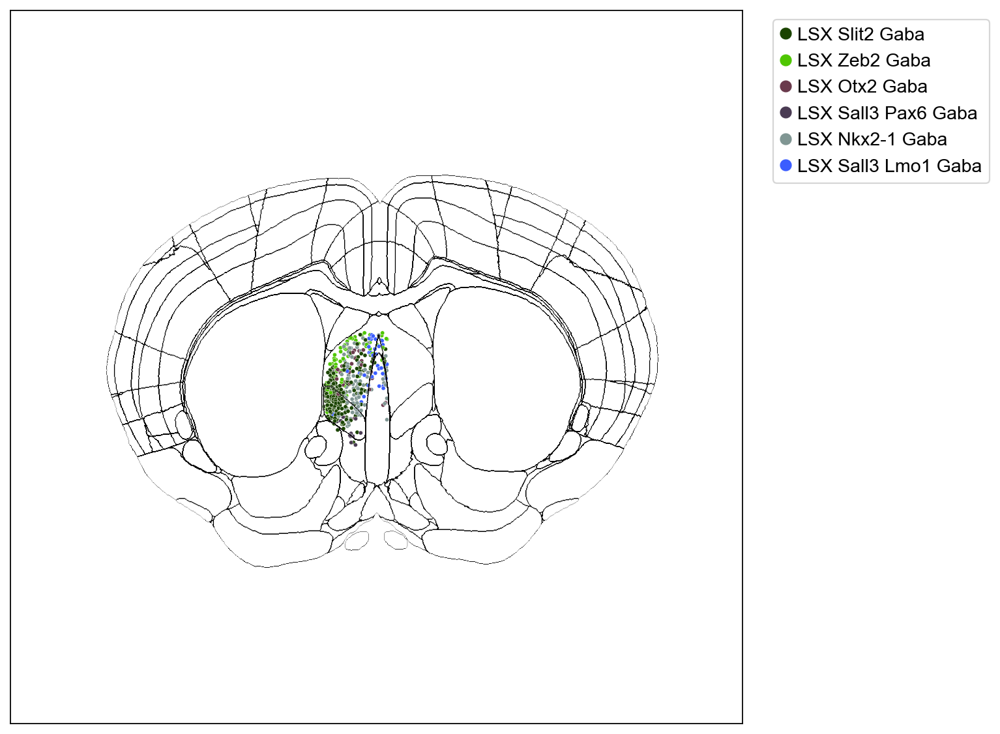

...

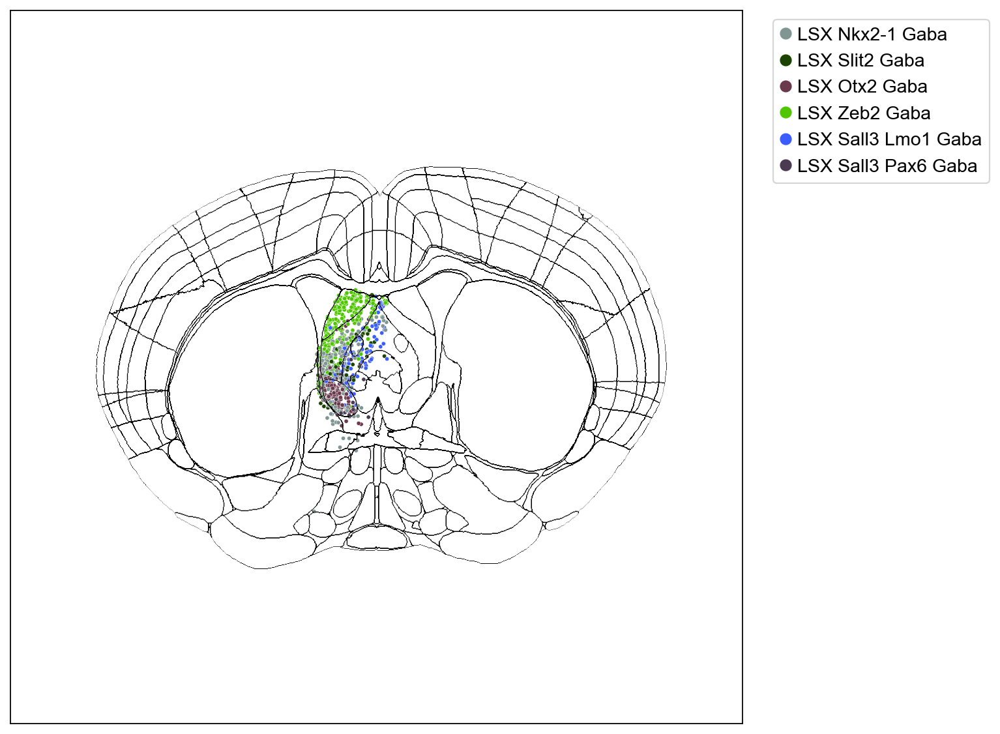

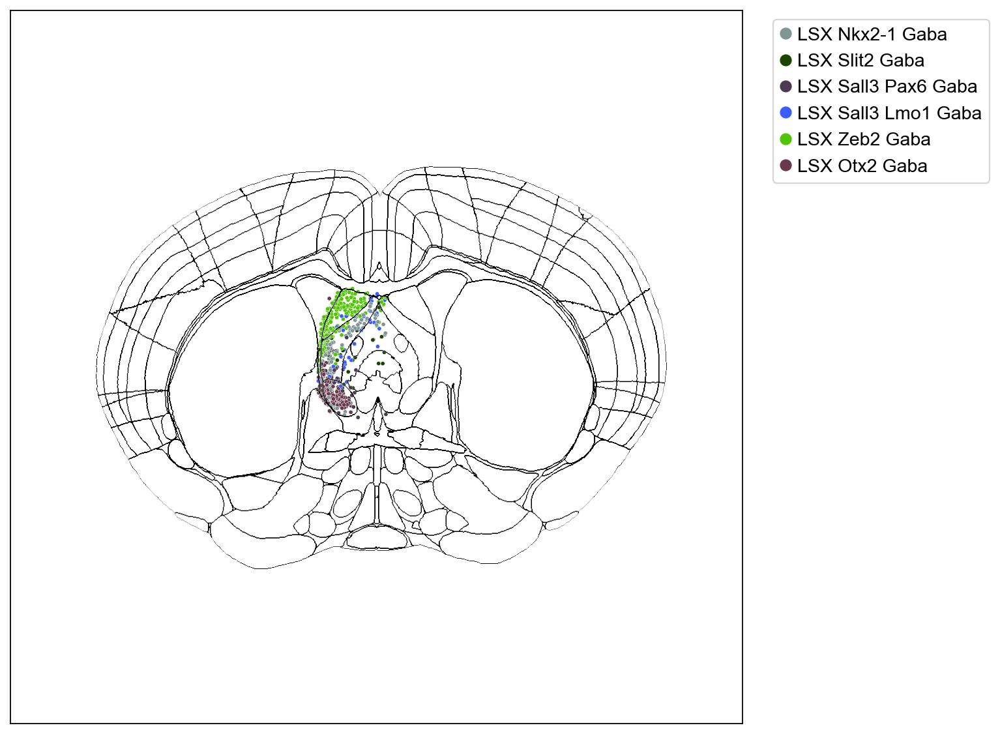

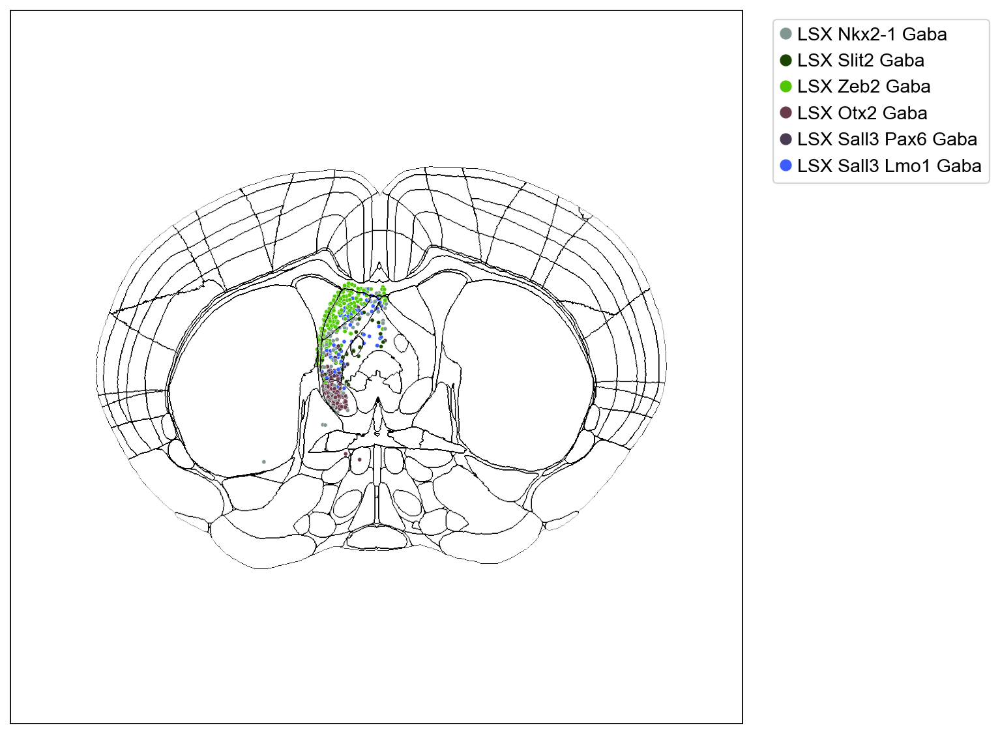

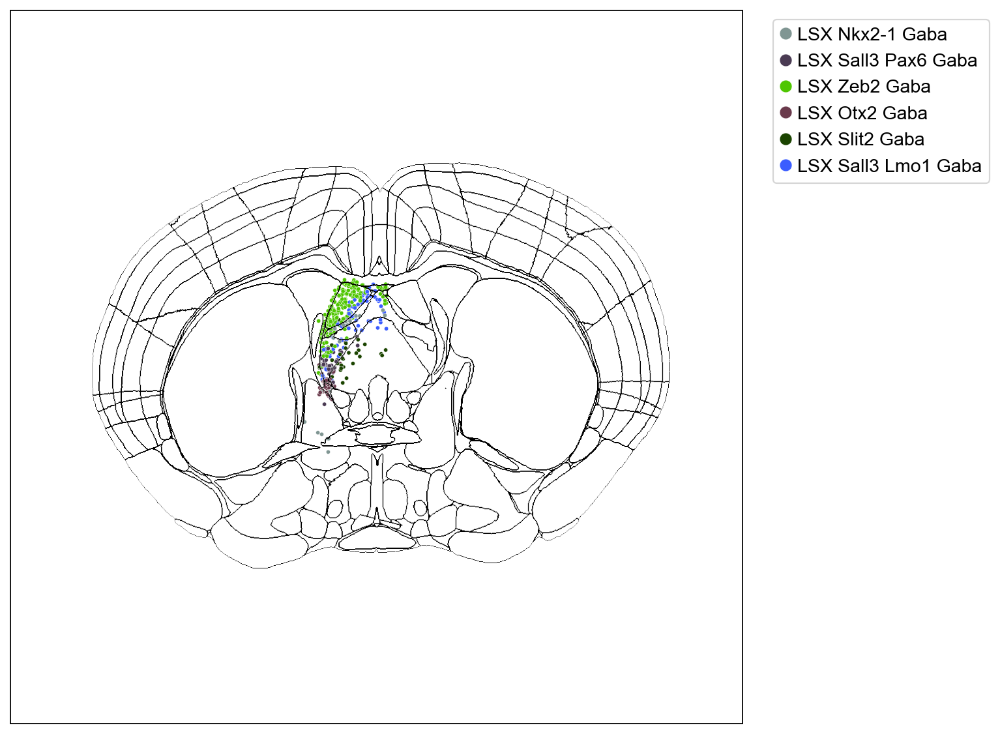

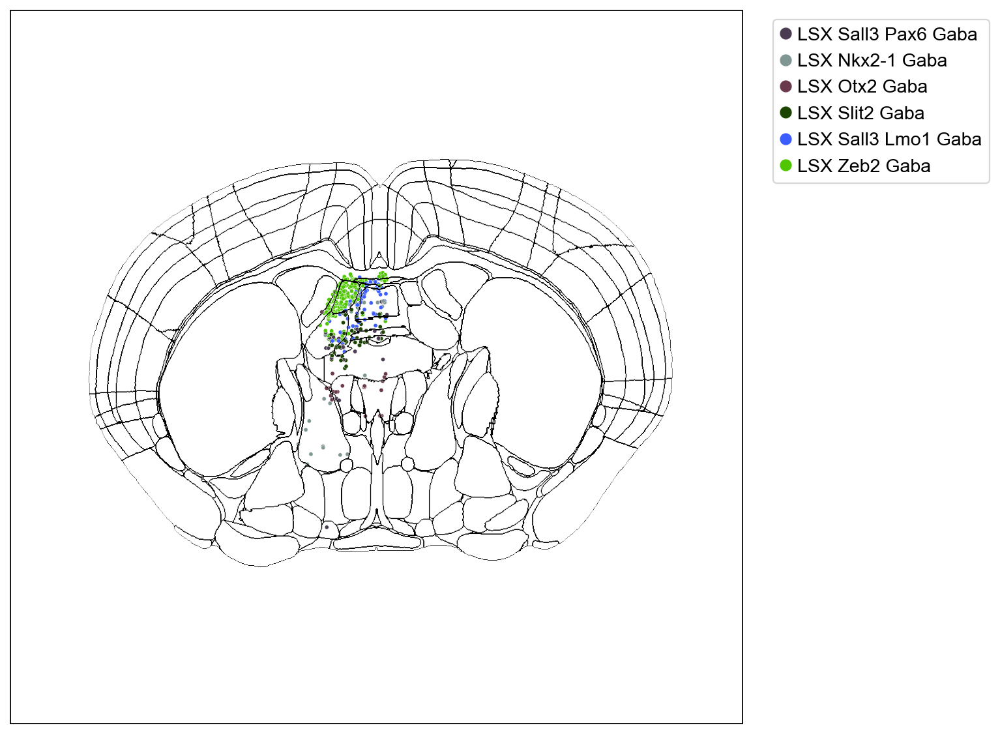

In [766]:
for id in reg_map.keys():
    plot_ccf_lsx(id)

(0.15, 11.3, 10.0, -1.75)

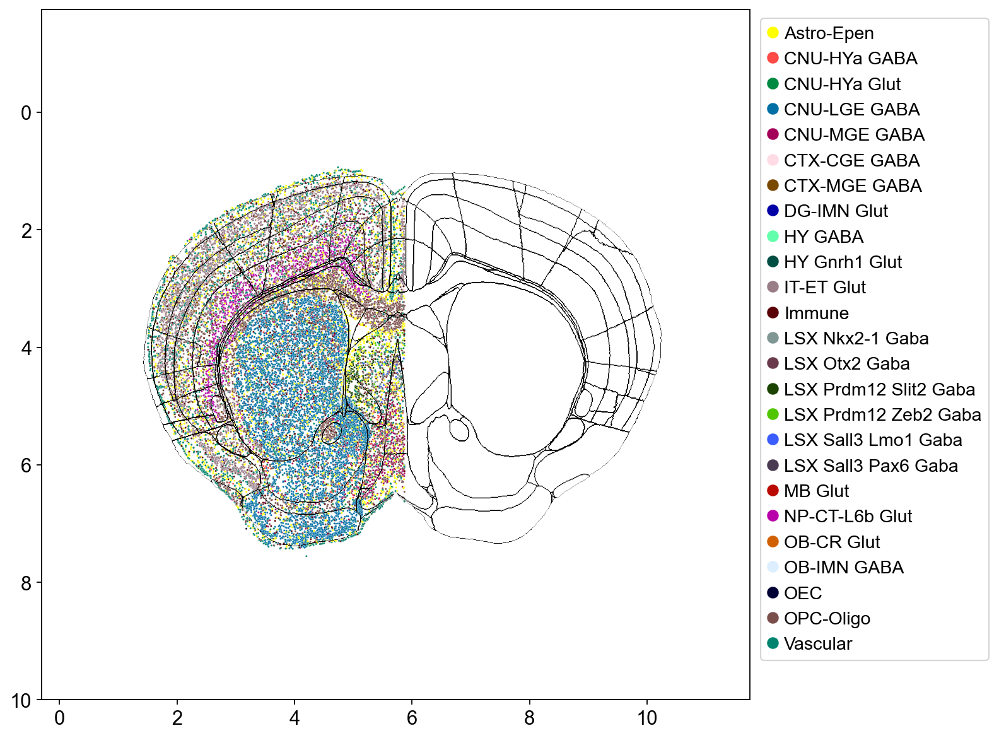

In [755]:
library_id = lsx_reg_list[2]
spatial = adatas[0][adatas[0].obs["brain_section_label"] == library_id].obsm['spatial']
img = adatas[0][adatas[0].obs["brain_section_label"] == library_id].uns['spatial'][library_id]["images"]['hires']
hue = adatas[0][adatas[0].obs["brain_section_label"] == library_id].obs['class_new']

fig, ax = plt.subplots()
fig.set_size_inches(9,9)
sns.scatterplot(x=spatial[:,0],y=spatial[:,1],s=2,zorder=1, hue=hue, palette=color_map, ax=ax, alpha=1)
ax.imshow(img, cmap=plt.cm.Greys, alpha=1.0*(img.squeeze()>0), zorder=2, extent=(0.15,11.3,10,-1.75))
ax.grid(False)
ax.legend(loc='upper right', bbox_to_anchor=(1.35, 1.0), ncol=1, markerscale=6)
ax.set_ylim(11,0)
ax.set_xlim(0,11)
ax.axis('equal')

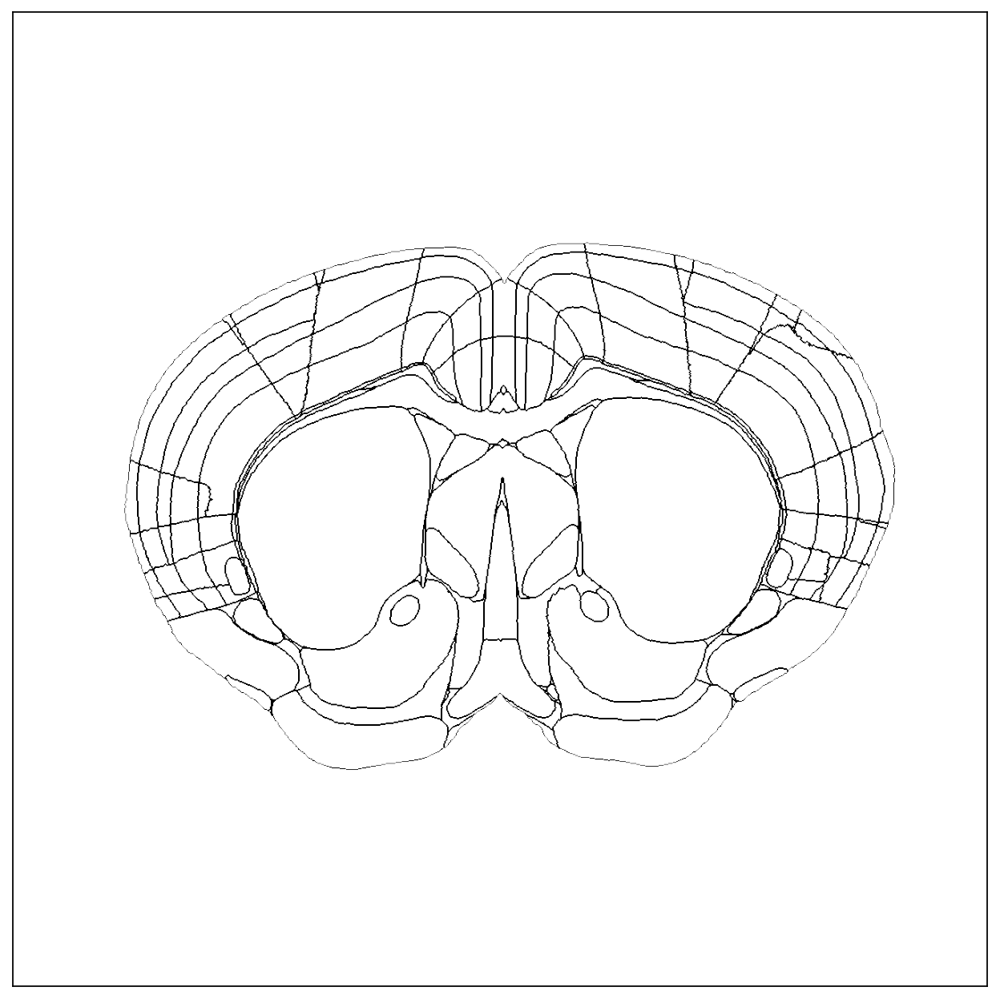

In [749]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(annotation_boundary_array[47], cmap=plt.cm.Greys, alpha=1.0*(annotation_boundary_array[47].squeeze()>0))
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
fig.savefig('./CCF_47.tif', bbox_inches='tight', pad_inches=0, dpi=300)